<a href="https://colab.research.google.com/github/MohamedddWael/Augmented_Reality_and_Image_Mosaics/blob/main/Image_Mosaics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Part 2: Image Mosaics

## Imports

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

## Utlilities

The following methods perform the following:

1. Convert form homogenous coordinates to heterogenous
2. Convert from heterogenous coordinates to homogenous
3. Apply the matrix transformation and return float coordinates **needed for forward mapping**

In [ ]:
def hom_to_hetr(coordinates):
  last_column = coordinates[:, -1]
  return coordinates[:, :-1] / last_column[:, np.newaxis]

In [ ]:
def hetr_to_hom(coordinates):
  return np.column_stack((coordinates, np.ones(coordinates.shape[0])))

In [ ]:
def apply_matrix_transformation(matrix, coordinates):
  hom_coordinates = matrix @ hetr_to_hom(coordinates).T
  return hom_to_hetr(hom_coordinates.T)

In [ ]:
def get_image_indices(image):
  return np.indices((image.shape[:2][::-1])).reshape(2, -1).T

## Downloading Images

In [ ]:
# Replace these with paths to your images
image1_path = "/content/pano_image1.jpg"
image2_path = "/content/pano_image2.jgp"
image3_path = "/content/shanghai-21.png"
image4_path = "/content/shanghai-22.png"
image5_path = "/content/shanghai-23.png"

pano_left = cv2.imread(image2_path)
pano_right = cv2.imread(image1_path)

image3 = cv2.imread(image3_path)
image4 = cv2.imread(image4_path)
image5 = cv2.imread(image5_path)

Left image shape: (683, 1024, 3)



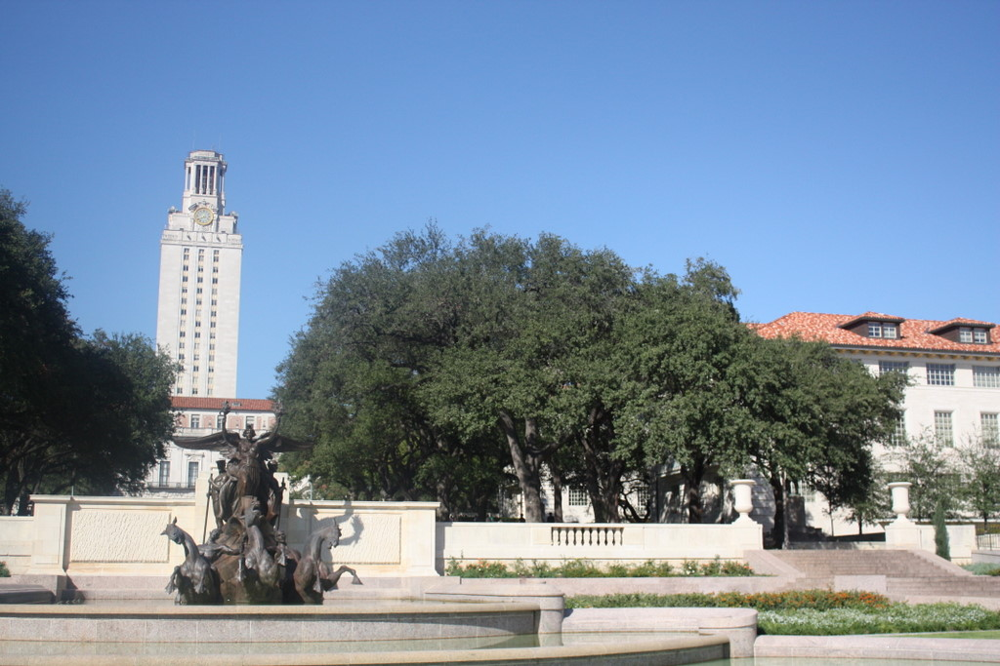

In [ ]:
print(f'Left image shape: {pano_left.shape}\n')
cv2_imshow(pano_left)

Right image shape: (683, 1024, 3)



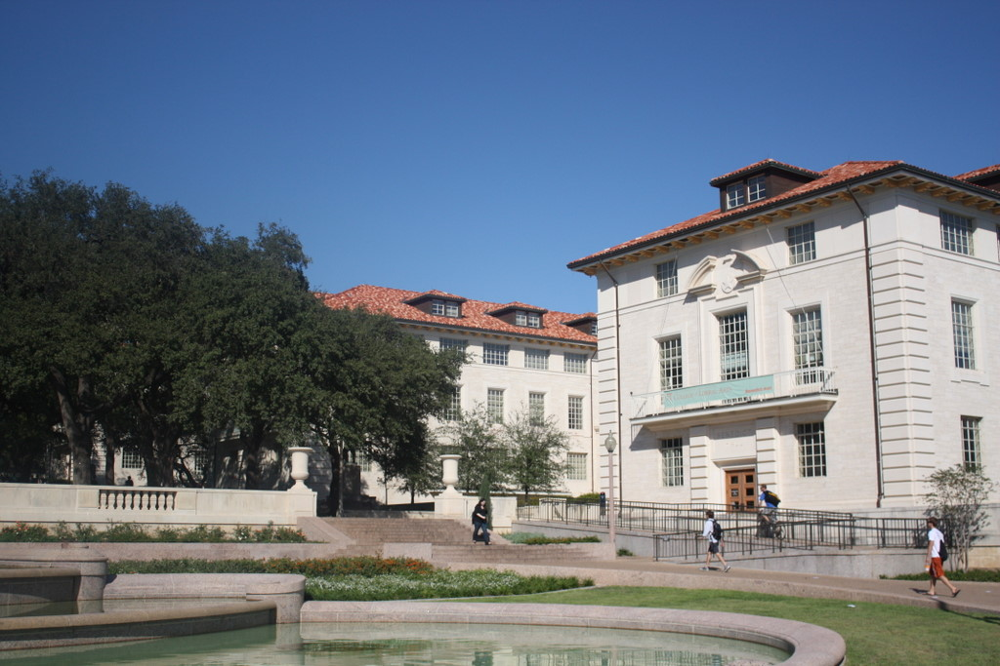

In [ ]:
print(f'Right image shape: {pano_right.shape}\n')
cv2_imshow(pano_right)

## Image Mosaics Steps

### 1. Getting Correspondences and Compute the Homography Parameters

In [ ]:
def get_correspondences(src_img, target_img, threshold, show_img=False):
  sift = cv2.SIFT_create()

  # Detecting keypoint
  src_img_kp, src_img_desc = sift.detectAndCompute(src_img, None)
  target_img_kp, target_img_desc = sift.detectAndCompute(target_img, None)

  # Getting matches using KNN with k=2
  bf = cv2.BFMatcher()
  matches = bf.knnMatch(src_img_desc, target_img_desc, k=2)

  # Applying ratio checking to get the good correspondences
  good_matches = []

  for a, b in matches:
    if a.distance <= b.distance * threshold:
      good_matches.append(a)

  if show_img:
    img_matches = cv2.drawMatches(src_img,
                                  src_img_kp,
                                  target_img,
                                  target_img_kp,
                                  good_matches[:50],
                                  None,
                                  flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    cv2_imshow(img_matches)

  src_pts = np.float32([src_img_kp[m.queryIdx].pt for m in good_matches])
  dst_pts = np.float32([target_img_kp[m.trainIdx].pt for m in good_matches])

  return src_pts, dst_pts

In [ ]:
def compute_homography_parameters(p, p_dash):
  assert len(p) >= 4

  A = []
  for i in range(len(p)):
    x, y = p[i]
    x_dash, y_dash = p_dash[i]
    A.append(np.array([-x, -y, -1, 0, 0, 0, x*x_dash, y*x_dash, x_dash]))
    A.append(np.array([0, 0, 0, -x, -y, -1, x*y_dash, y*y_dash, y_dash]))

  A = np.array(A)
  U, S, Vt = np.linalg.svd(A, full_matrices=False)

  min_eigenvalue_index = np.argmin(S)
  x = Vt[min_eigenvalue_index, :]

  factor = x[-1]
  x = x * (1/factor)
  x = x.reshape((3, 3))

  return x

### 2. Warping Between Image Planes

In [ ]:
def forward_warping(left_img, right_img, homography_matrix, size, height_offset, width_offset):
  h, w = right_img.shape[0:2]
  old_pts_right = get_image_indices(right_img)
  old_pts_left = get_image_indices(left_img)
  transformed_pts = np.rint(apply_matrix_transformation(homography_matrix, old_pts_right)).astype(int)

  warped_image = np.zeros(size, dtype=left_img.dtype)

  for old_pt, transformed_pt in zip(old_pts_right, transformed_pts):
    warped_image[transformed_pt[1] + height_offset][transformed_pt[0] + width_offset] = right_img[old_pt[1]][old_pt[0]]

  for old_pt in old_pts_left:
    warped_image[old_pt[1] + height_offset][old_pt[0] + width_offset] = left_img[old_pt[1]][old_pt[0]]

  return warped_image

**This funnction is used to perform inverse warping:**

**parameters**

1. **img** The mosaic of images generated from warping them to new image.
2. **right_img** The transformed image using homography.
3. **inv_homography_matrix** The inverse homography matrix used to warp the right_img on the left
4. **hight_offset** The offset of the warped image from the top
5. **width_offset** The offset of the warped image from the left

**returns**

The mosaic of the images after perfroming inverse warping and fixing the holes problem

**steps**

1. Find the locations of the holes **have pixel value == 0** in the mosaic of images
2. Inverse the vertical and horizontal shifting used in forward warping.
3. Apply the inverse transformation on the coordinates of the holes and get their original locations on the warped image.
4. Perfrom bilinear interpolation using the neighbours of the transformed points to determine their values.
5. Fill the holes in the mosaic of images with the values obtained by interpolating the neighbours of poins obtained by inverse homography

In [ ]:
def backward_warping(image, right_img, inv_homography_matrix, height_offset, width_offset):
  h, w = right_img.shape[:2]
  warped_image = image.copy()

  holes_indecies = np.column_stack(np.where(np.all(warped_image < 20, axis=-1)))
  holes_indecies[:, 0] = holes_indecies[:, 0] - height_offset
  holes_indecies[:, 1] = holes_indecies[:, 1] - width_offset
  holes_indecies = holes_indecies[:, [1, 0]]

  org_from_holes = apply_matrix_transformation(inv_homography_matrix, holes_indecies)

  for hole, org in zip(holes_indecies, org_from_holes):
    if org[1] < 0 or org[0] < 0 or org[1] >= h-1 or org[0] >= w-1:
      continue

    for i in range(right_img.shape[2]):
      x_min, x_max = int(np.floor(org[1])), int(np.ceil(org[1]))
      y_min, y_max = int(np.floor(org[0])), int(np.ceil(org[0]))

      x_y_mat = np.array([[right_img[x_min, y_min, i], right_img[x_min, y_max, i]],
                          [right_img[x_max, y_min, i], right_img[x_max, y_max, i]]])

      x_vec = np.array([x_max - org[1], org[1] - x_min])
      y_vec = np.array([y_max - org[0], org[0] - y_min])

      x_vec = x_vec.reshape(1, 2)
      y_vec = y_vec.reshape(2, 1)

      value = x_vec.dot(x_y_mat).dot(y_vec)
      value = int(value)

      warped_image[hole[1] + height_offset, hole[0] + width_offset][i] = value

  return warped_image

Find the matches between the left and right image with distance ratio 0.3 and visualize them

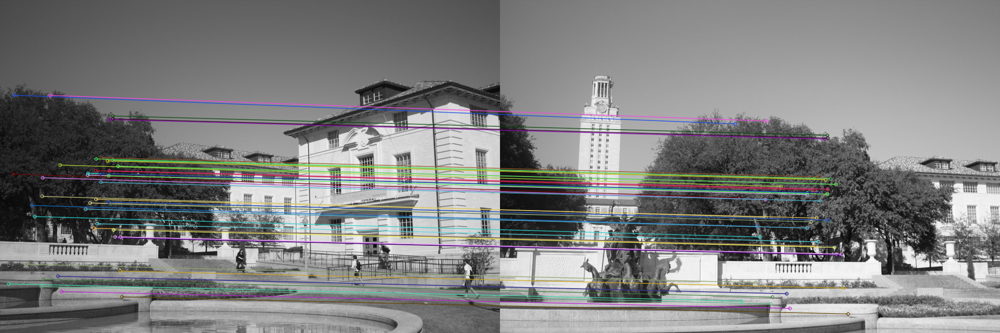

In [ ]:
gray_pano_left = cv2.cvtColor(pano_left, cv2.COLOR_BGR2GRAY)
gray_pano_right = cv2.cvtColor(pano_right, cv2.COLOR_BGR2GRAY)
src_pts, dst_pts = get_correspondences(gray_pano_right, gray_pano_left, 0.3, True)

In [ ]:
homography_matrix = compute_homography_parameters(src_pts, dst_pts)
forward_warping_img = forward_warping(pano_left, pano_right, homography_matrix, (850, 1650, 3), 100, 0)

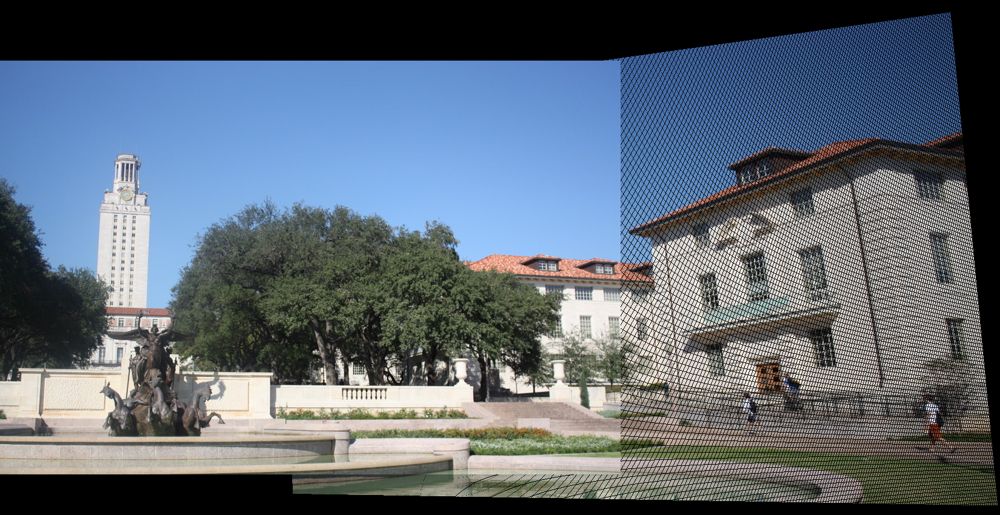

In [ ]:
cv2_imshow(forward_warping_img)

In [ ]:
inv_homography_matrix = np.linalg.inv(homography_matrix)
backward_warping_img = backward_warping(forward_warping_img, pano_right, inv_homography_matrix, 100, 0)

<ipython-input-99-09358533a628>:30: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  value = int(value)


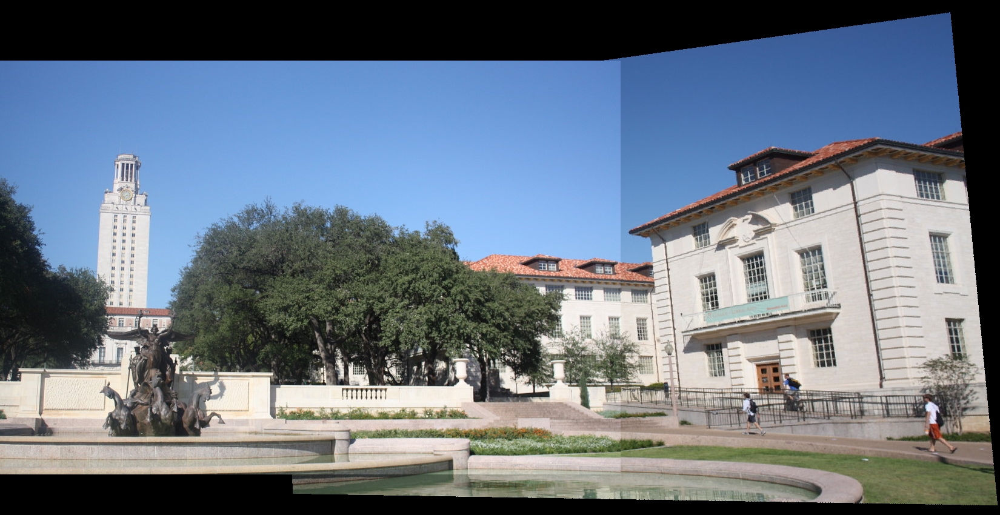

In [ ]:
cv2_imshow(backward_warping_img)

### 3. Create the output mosaic

In [ ]:
def generate_mosaic(left_img, right_img, size, height_offset, width_offset):
  gray_left = cv2.cvtColor(left_img, cv2.COLOR_BGR2GRAY)
  gray_right = cv2.cvtColor(right_img, cv2.COLOR_BGR2GRAY)
  src_pts, dst_pts = get_correspondences(gray_right, gray_left, 0.3, False)

  homography_matrix = compute_homography_parameters(src_pts, dst_pts)
  forward_warping_img = forward_warping(left_img, right_img, homography_matrix, size, height_offset, width_offset)

  inv_homography_matrix = np.linalg.inv(homography_matrix)
  backward_warping_img = backward_warping(forward_warping_img, right_img, inv_homography_matrix, height_offset, width_offset)

  return backward_warping_img

<ipython-input-99-09358533a628>:30: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  value = int(value)


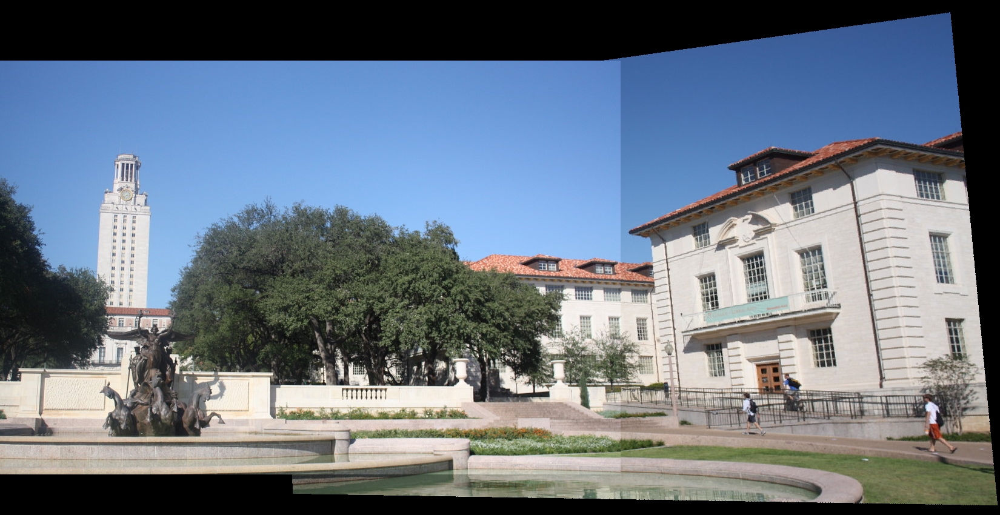

In [ ]:
mosaic = generate_mosaic(pano_left, pano_right, (850, 1650, 3), 100, 0)
cv2_imshow(mosaic)

In [ ]:
city1_path = "/content/WhatsApp Image 2024-11-24 at 12.52.06 AM (1).jpeg"
city2_path = "/content/WhatsApp Image 2024-11-24 at 12.52.06 AM.jpeg"

city_left = cv2.imread(city1_path)
city_right = cv2.imread(city2_path)
print(city_left.shape)
print(city_right.shape)

(1280, 960, 3)
(1280, 960, 3)


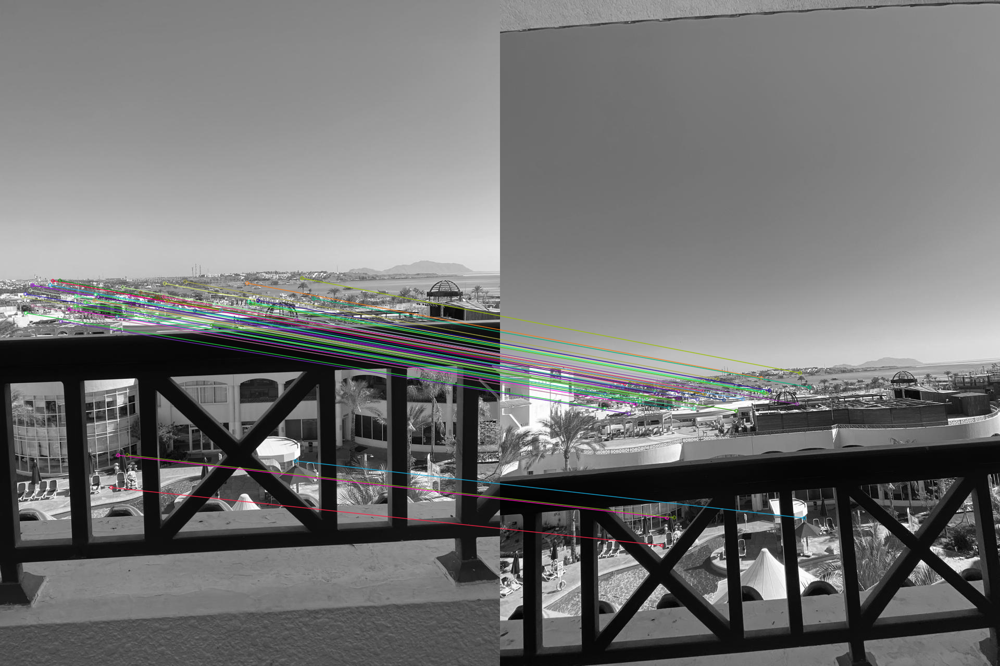

In [ ]:
gray_city_left = cv2.cvtColor(city_left, cv2.COLOR_BGR2GRAY)
gray_city_right = cv2.cvtColor(city_right, cv2.COLOR_BGR2GRAY)
src_pts, dst_pts = get_correspondences(gray_city_right, gray_city_left, 0.3, True)

<ipython-input-99-09358533a628>:30: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  value = int(value)


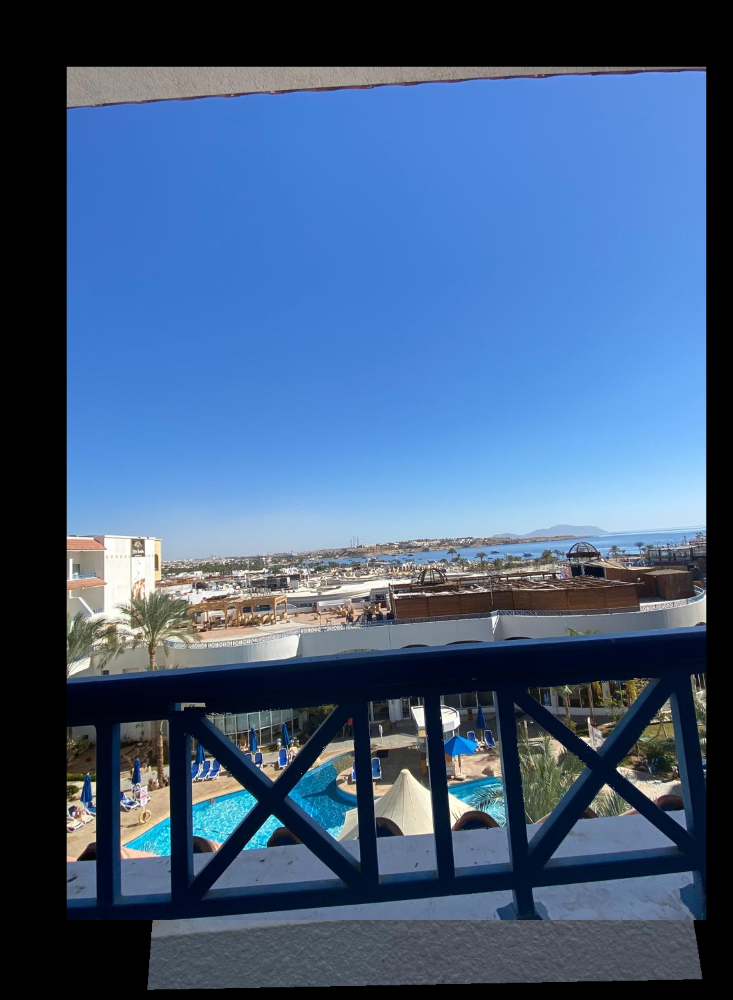

In [ ]:
mosaic = generate_mosaic(city_left, city_right, (1500, 1100, 3), 100, 100)
cv2_imshow(mosaic)

# Bonus Part

In the part we stich 3 images be perfrom the previous on two images and stich their result with the third image

<ipython-input-99-09358533a628>:30: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  value = int(value)


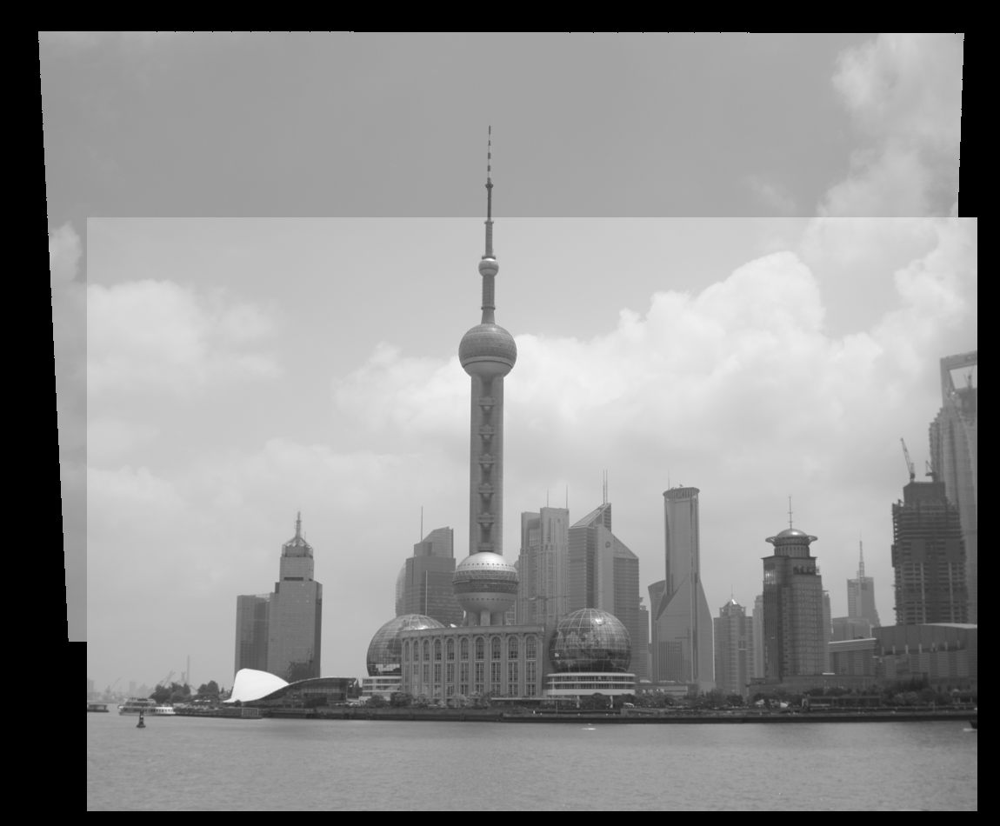

In [ ]:
mosaic1 = generate_mosaic(image3, image4, (950, 1150, 3), 250, 100)
cv2_imshow(mosaic1)

<ipython-input-99-09358533a628>:30: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  value = int(value)


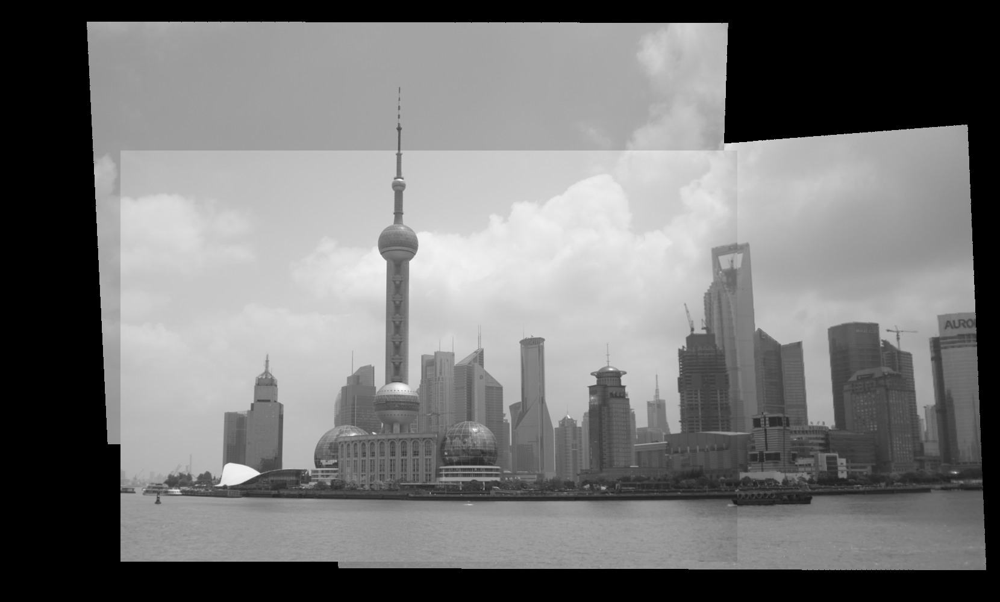

In [ ]:
mosaic2 = generate_mosaic(mosaic1, image5, (1000, 1660, 3), 0, 100)
cv2_imshow(mosaic2)